🐶 **Using Transfer Learning and tansorflow 2.0 to classify different dog breeds** **bold text**

## 1.Problem
Identifying the breed of a dog given an image  of a dog.
when i'm sitting at the cafe and i take a photo of a dog, want to know what breed of dog it is.

## 2.Data

In this project we're to be using machine learning to help us identify different breeds of dogs.
to do this we'll using data from the [Kaggle dog breed identification competition ](https://www.kaggle.com/c/dog-breed-identification/overview)
it consists of a collection of 10,000 labelled images of 120 different dog breeds.

## 3. Evaluation

the evaluation is a fille with prediction probabilities for each dog breed of each test image.

## 4.Features

some information about data :
* we are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).

* there are around 10,000+ images in the training set (these images have labels)
* there are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).




# ***Get Our workspace ready***

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras
import os

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [ ]:
print("TF version:" ,tf.__version__)
print("Hub version:" ,hub.__version__)
# Check for gpu availability
print("GPU ", "available (YESSSSSSSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :( ")

TF version: 2.17.1
Hub version: 0.16.1
GPU  available (YESSSSSSSSSS!!!!)


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. so that's what  we'll be doing first turning our images into Tensors(numerical representaions).

let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


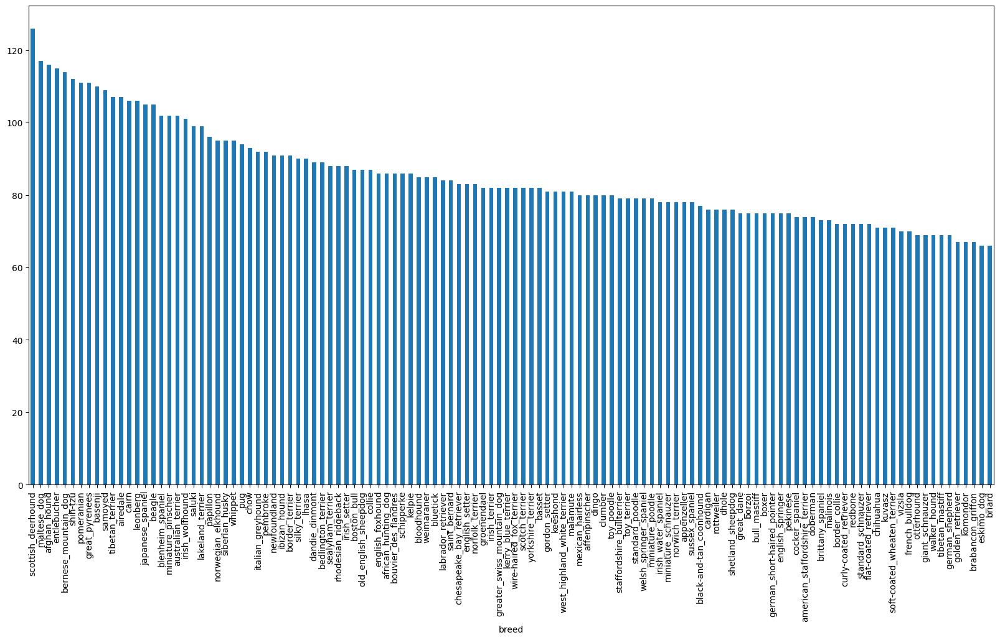

In [ ]:
# how many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

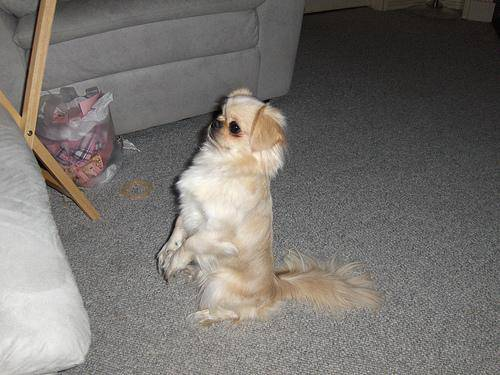

In [ ]:
# Let's view image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting images and their labels
Let's get a list of our image file pathnames.

In [ ]:
# Creat pathnames from image ID's
filenames=["drive/MyDrive/Dog Vision/train/"+fname +".jpg" for fname in labels_csv["id"]]
# Check the first 10
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual image files")
else:
  print("Filenames do not match actual image files")

Filenames match actual image files


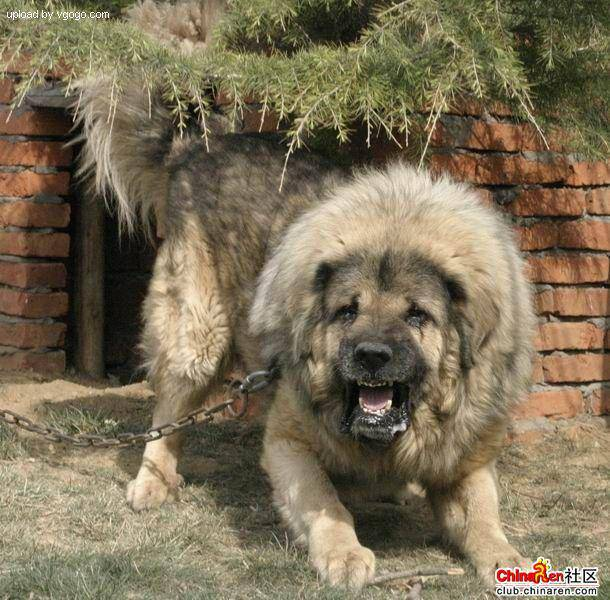

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
# labels=np.array(labels) # do same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into bollean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example : Turning boolearn array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Set up X & y variables
X=filenames
y= boolean_labels

In [ ]:
len(filenames)

10222

we're going to start off experimenting with 1000 images and increase  as nedded

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:10}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                            test_size=0.2,
                                            random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

# Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few:
1. Take an image filepath as input
2. use Tensorflow to read the file and save it to a varialbe, `image`
3. turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do, let's see what importing  an image looks like.

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we'vw seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. use Tensorflow to read the file and save it to a varialbe, `image`
3. turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE=224
# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired size (244,244)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches

why turn our data into batches

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

so that's why we do 32 images at a time (you can manually adjust the batch size if need be).

In order to use Tensorflow effectively, we need our data in the form of tensor tuples which look like this:
`(image,label)`

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image=process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))


(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors
in the forms : `(image,label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE=32
# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels)

  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                             tf.constant(y))) # labels

    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                             tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffer
    data=data.shuffle(buffer_size=len(X))
    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)
    # Turn the data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend , let's visualize them!

In [ ]:
# 233
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

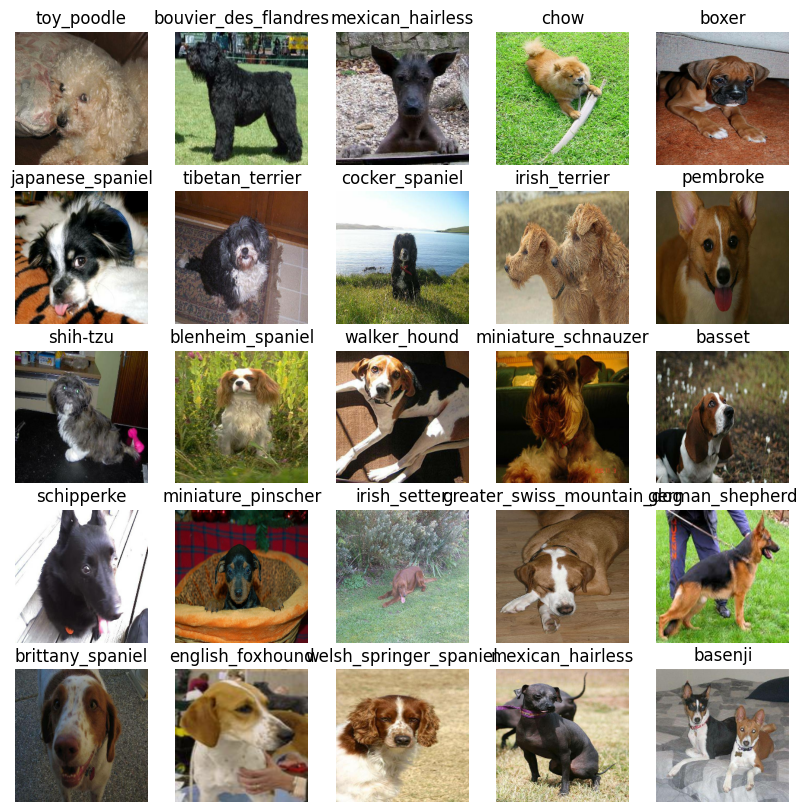

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

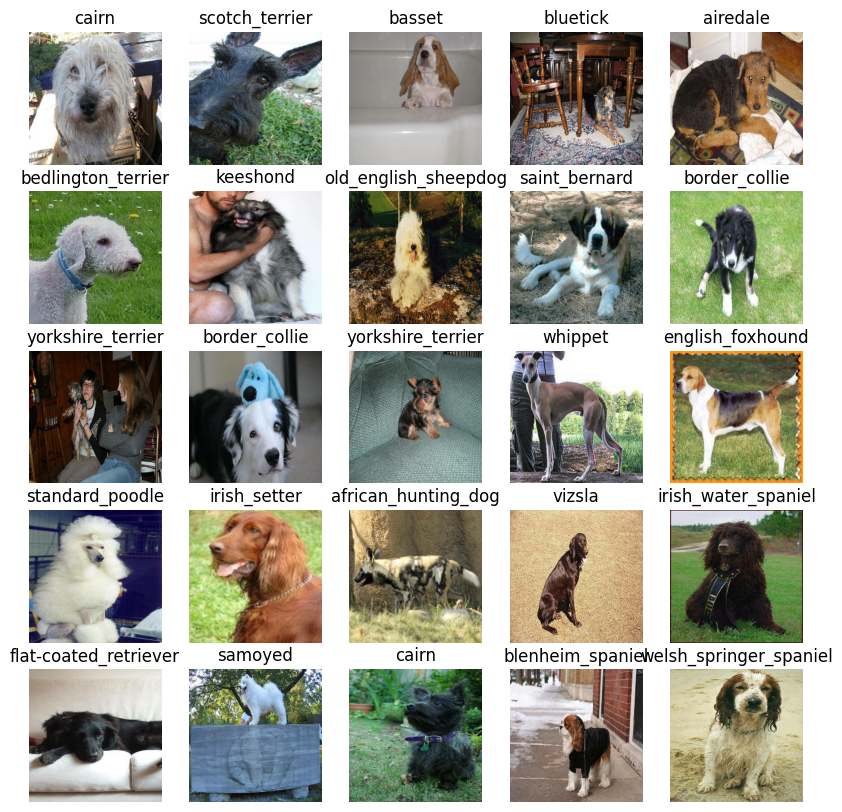

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model
Before we build a model, there are a few things we need to define :
* The input shape (Our images shapem in the form of Tensors) to our model.
* The Output shape(image labels, in the form of Tesnors) of our model.
* the url of model we want to use. we want to use from Tensorflow Hub- https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"


Now we've got our inputs, outputs and model ready to go.
let's put theme togher into a keras deep learning model!

Knowing this, let's create a function which:

*  Takes the input shape, output shape and the model we've chosen as parameters
*  Defines the layers in a keras model in sequential fashion (do this first than thi then that).
* Compile the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.
All of these steps can be found here : https://www.tenserflow.org/guide/keras/overview


In [ ]:
# Create a function which builds akeras model
# pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  # Setup the model layers
  model=tf_keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


# Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save it's progress, check its progress or stop training early if a model stops improving.

we'll create tow callbacks, oe for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able tto save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the %tensorBoard magic function (we'll do this after model training)


In [ ]:
# Load Tensorboard notebook extension

%load_ext tensorboard


In [ ]:
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/My Drive/Dog Vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Make it so the logs get tracked whenever we run an experiment
  return tf_keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
# Create early stopping callback
early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)


## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.


In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}
# Check to make  sure we're still running on a gpu
print("GPU","available (YESSSSSSSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :( ")

GPU available (YESSSSSSSSSS!!!!)


let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passingit the training data, validation data, number of epoches to train for (`Num_EPOCHS`) and the callback we want to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model=create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()
  # Fit the model to the data  passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [ ]:
# Fit the model to the data 243
model=train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 184s 7s/step - loss: 4.7282 - accuracy: 0.0900 - val_loss: 3.3653 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 39s 2s/step - loss: 1.6203 - accuracy: 0.6925 - val_loss: 2.0474 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 37s 1s/step - loss: 0.5359 - accuracy: 0.9425 - val_loss: 1.5721 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 38s 1s/step - loss: 0.2280 - accuracy: 0.9962 - val_loss: 1.4044 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 41s 2s/step - loss: 0.1343 - accuracy: 0.9975 - val_loss: 1.3299 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 37s 2s/step - loss: 0.0922 - accuracy: 1.0000 - val_loss: 1.2914 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 40s 2s/step 

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to begin with is a good thing! it means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions=model.predict(val_data,verbose=1) # verbose shows us how long each epoch takes
predictions

7/7 [==============================] - 37s 6s/step


array([[0.00264711, 0.01337145, 0.00113739, ..., 0.00286223, 0.00971501,
        0.00126458],
       [0.00311606, 0.02005043, 0.00921585, ..., 0.00275242, 0.01557077,
        0.00109104],
       [0.02091751, 0.00354941, 0.00141147, ..., 0.00043677, 0.00281852,
        0.00725457],
       ...,
       [0.10627294, 0.00779848, 0.00203432, ..., 0.001014  , 0.02328289,
        0.00560612],
       [0.03235255, 0.00910534, 0.00102823, ..., 0.00252398, 0.06317011,
        0.00146772],
       [0.03332675, 0.00217274, 0.00479099, ..., 0.0015706 , 0.00102716,
        0.00484529]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([2.6471051e-03, 1.3371451e-02, 1.1373918e-03, 1.0199361e-02,
       3.0130765e-04, 5.0012255e-03, 9.5393840e-04, 3.8740618e-04,
       3.2683620e-03, 8.4017625e-04, 8.7557500e-03, 5.1849220e-02,
       1.3770417e-03, 4.5641404e-02, 4.2457958e-03, 1.0409261e-03,
       1.2982759e-02, 8.9334799e-03, 4.2550704e-03, 1.2555667e-03,
       5.4416276e-04, 1.0916737e-03, 2.9383210e-02, 2.6461408e-03,
       2.2134795e-03, 4.6693180e-03, 5.4067962e-02, 3.9621815e-03,
       5.4695394e-02, 5.8214352e-03, 1.6438935e-02, 2.4304170e-02,
       2.4698062e-03, 6.7365770e-03, 2.9736762e-03, 4.7412410e-04,
       9.9518728e-03, 8.5908007e-03, 3.1502186e-03, 7.4353052e-04,
       1.0101639e-02, 3.5501001e-03, 8.8451497e-02, 6.1077741e-04,
       1.5556692e-02, 5.7788189e-03, 1.6099541e-02, 5.6790269e-04,
       2.5402668e-03, 5.8403984e-03, 6.7801196e-03, 5.8039289e-04,
       4.2666020e-03, 2.2615874e-03, 5.7632737e-03, 7.2941947e-04,
       9.5910934e-04, 4.1316804e-03, 4.2485535e-02, 4.1958168e

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
# soft max
index=113
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[2.6471051e-03 1.3371451e-02 1.1373918e-03 1.0199361e-02 3.0130765e-04
 5.0012255e-03 9.5393840e-04 3.8740618e-04 3.2683620e-03 8.4017625e-04
 8.7557500e-03 5.1849220e-02 1.3770417e-03 4.5641404e-02 4.2457958e-03
 1.0409261e-03 1.2982759e-02 8.9334799e-03 4.2550704e-03 1.2555667e-03
 5.4416276e-04 1.0916737e-03 2.9383210e-02 2.6461408e-03 2.2134795e-03
 4.6693180e-03 5.4067962e-02 3.9621815e-03 5.4695394e-02 5.8214352e-03
 1.6438935e-02 2.4304170e-02 2.4698062e-03 6.7365770e-03 2.9736762e-03
 4.7412410e-04 9.9518728e-03 8.5908007e-03 3.1502186e-03 7.4353052e-04
 1.0101639e-02 3.5501001e-03 8.8451497e-02 6.1077741e-04 1.5556692e-02
 5.7788189e-03 1.6099541e-02 5.6790269e-04 2.5402668e-03 5.8403984e-03
 6.7801196e-03 5.8039289e-04 4.2666020e-03 2.2615874e-03 5.7632737e-03
 7.2941947e-04 9.5910934e-04 4.1316804e-03 4.2485535e-02 4.1958168e-03
 5.8112625e-04 5.0313724e-03 1.6753449e-03 1.6016414e-03 5.5120676e-05
 5.7317887e-04 2.1450182e-04 1.3956466e-02 2.2423091e-04 8.8052871e-03
 1.830

Having the above functionality is great but we want to be able to do it at scale.

and it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probailities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into thier respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a preddicted label based on an array of prediction probalilities
pred_label=get_pred_label(predictions[0])
pred_label

'newfoundland'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch  dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays
  of images and labels.
  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
# Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make function to make these all a bit more visaulize

we'll create a function which:

* Takes an array of prediction probilities, an array of truth labels and an array of images and integers.

* Convert the prediction probailities to a predicted label.

* plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  # Get the predcition label
  pred_label=get_pred_label(pred_prob)
  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the Colour of title depending on if predcition is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"
  # Change the color of the title depending on if the prediction is right or wrong
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,true_label),color=color)


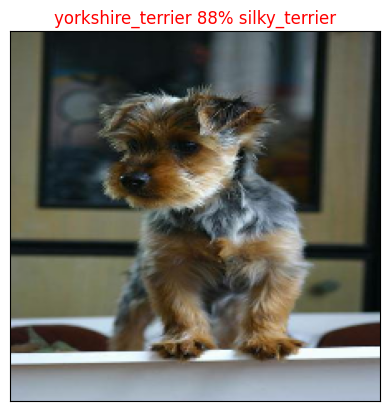

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=106)


Now we've got one function to visalize our models top prediction, let's make another to view our models top 10 predictions.

this function will :
* Take an input of prediction probabilities array and a ground truth array and an integer

* Find  the prediction using `get_pred_label()`

* Find the top 10:
  
   * Prediction probalibilities index

   * prediction probabilites values

   * prediction labels

* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probailities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob,true_label=prediction_probailities[n],labels[n]
  # Get the predicted label
  pred_label=get_pred_label(pred_prob)
  # Find the top 10 prediction confidence index
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels= unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,rotation="vertical")
  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

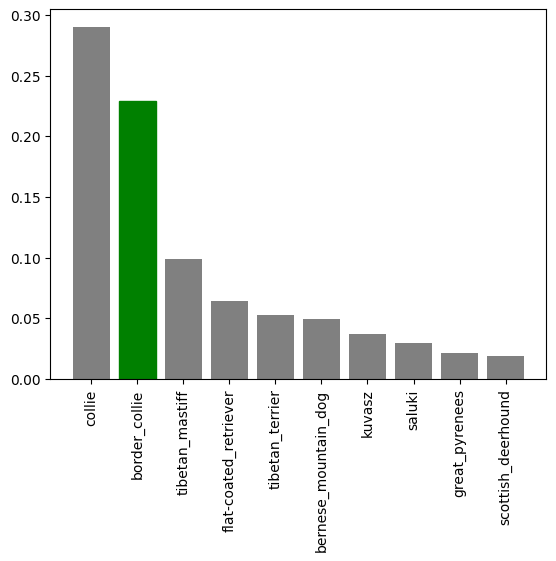

In [ ]:
plot_pred_conf(prediction_probailities=predictions,labels=val_labels,n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few


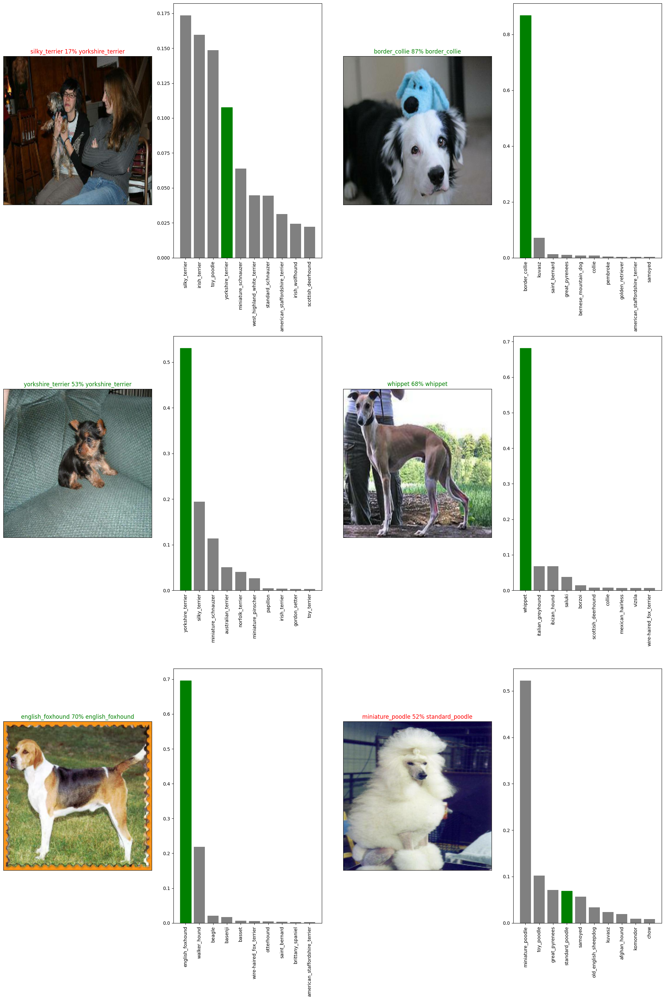

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,10*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probailities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge**: how would you create a confusion matrix with our models predictions and true labels?


## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir=os.path.join("drive/My Drive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"_"+suffix+".h5" # save format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load atrained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=tf_keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got function to save and load a trained model,let's make sure they work!

In [ ]:
# save our model trained on 1000 image
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20241208-17491733680160_1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20241208-17491733680160_1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_image_model=load_model('drive/My Drive/Dog Vision/models/20241207-11361733571368_1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20241207-11361733571368_1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.1777 - accuracy: 0.7100


[1.1776763200759888, 0.7099999785423279]

In [ ]:
# Evaluate the loaded modal
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 9s 986ms/step - loss: 1.2489 - accuracy: 0.6850


[1.24892258644104, 0.6850000023841858]

# Training a big dog model 🐶 (on the full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitore validation accuracy if accuracy stops going up for three epoches  we're going to stop training so it doesn't overfished
full_model_early_stopping=tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)


**Note:** running the cell below will take a little while (maybe up to 30 minutes for for the first epoch) because the GPU we're using in the runtime  has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 1652s 5s/step - loss: 1.2776 - accuracy: 0.6759
Epoch 2/100
320/320 [==============================] - 413s 1s/step - loss: 0.3759 - accuracy: 0.8869
Epoch 3/100
320/320 [==============================] - 413s 1s/step - loss: 0.2196 - accuracy: 0.9411
Epoch 4/100
320/320 [==============================] - 400s 1s/step - loss: 0.1388 - accuracy: 0.9681
Epoch 5/100
320/320 [==============================] - 409s 1s/step - loss: 0.0970 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 414s 1s/step - loss: 0.0704 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 412s 1s/step - loss: 0.0515 - accuracy: 0.9930
Epoch 8/100
320/320 [==============================] - 405s 1s/step - loss: 0.0416 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 403s 1s/step - loss: 0.0327 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 411s 1s/step - loss: 0.02

In [ ]:
save_model(full_model,suffix="all-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20241208-20401733690419_all-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20241208-20401733690419_all-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model('drive/My Drive/Dog Vision/models/20241208-10251733653542_all-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20241208-10251733653542_all-images-mobilenetv2-Adam.h5


# Making prediction on on the test dataset

since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into same format.

luckily we created `create_data_batches()` earlier which can take a list of fileenames as input and conver them into tensor batches.

To make predictions on the test data,we'll:
* Get the test image filenames
* COnvert the filenames into test data batches using `create_data_batches()`  and setting the `test_data` parameter to `true` (since  the tesst data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path= "drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e06ce40d62d3d198f2df70349104a002.jpg',
 'drive/MyDrive/Dog Vision/test/e1b0cbcf3235fe9a7b35c1652081ff8d.jpg',
 'drive/MyDrive/Dog Vision/test/e647098485898391b700270c61824282.jpg',
 'drive/MyDrive/Dog Vision/test/e6343c835d2d07d7f3ac962b92415743.jpg',
 'drive/MyDrive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 'drive/MyDrive/Dog Vision/test/e5ad4cc7818e4eed04d209da177afa6f.jpg',
 'drive/MyDrive/Dog Vision/test/e48f3d4f0514a07f4777a30f01d32ea9.jpg',
 'drive/MyDrive/Dog Vision/test/e3c97ed588b32f49c7aae65cf91f17ba.jpg',
 'drive/MyDrive/Dog Vision/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/Dog Vision/test/e41802f671c437c10e843400dcea40fb.jpg']

In [ ]:
# create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an 1h)

In [ ]:
# Make prediction on test data batch using the loaded full model
test_predictions= loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 249s 741ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
import numpy as np
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions=np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.69087568e-08, 3.46169742e-07, 9.44997303e-10, ...,
        4.02979489e-13, 8.95321248e-11, 3.49907907e-08],
       [3.28391286e-10, 4.41103698e-18, 1.50388904e-14, ...,
        5.89949476e-13, 6.70202479e-12, 8.32412013e-19],
       [9.55595714e-10, 4.07434300e-14, 6.39871619e-13, ...,
        1.43289469e-09, 5.98830745e-14, 1.87271754e-10],
       ...,
       [2.10163907e-05, 5.58430154e-14, 3.13744281e-10, ...,
        2.85465176e-11, 1.05271868e-11, 8.43104342e-09],
       [1.56303770e-09, 1.25231097e-07, 4.77159157e-09, ...,
        9.25013052e-11, 1.46608272e-05, 6.19860087e-03],
       [3.22752926e-15, 1.20414564e-15, 1.00177426e-14, ...,
        5.32802257e-14, 2.08553551e-15, 4.07356991e-16]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for Kaggle

Looking at the Kaggle sample submission we find that it wants our models prediction probability outputs in a DataFrame with an ID column different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format we'll:
* Create a pandas Dataframe with an ID column as well as a column for each dog  breed

* add data to the ID column by extracting the test image ID's from their filepaths.

* Add data (the pretodiction probabilites) to each of the dog breed columns

* Export the dataframe as a CSV to Submit it to kaggle

In [ ]:
# Create a pandas Dataframe with empty columns
preds_df= pd.DataFrame(columns=["id"]+list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e06ce40d62d3d198f2df70349104a002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1b0cbcf3235fe9a7b35c1652081ff8d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e647098485898391b700270c61824282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6343c835d2d07d7f3ac962b92415743,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e78b4a09e5f86c330e24c6aaed63f0be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e06ce40d62d3d198f2df70349104a002,5.690876e-08,3.461697e-07,9.449973e-10,1.139128e-05,8.760835e-08,1.010060e-02,2.663651e-11,4.685222e-09,3.244405e-09,...,3.297512e-11,2.335864e-09,8.564486e-12,1.114801e-08,4.121370e-10,2.015017e-08,2.784359e-10,4.029795e-13,8.953212e-11,3.499079e-08
1,e1b0cbcf3235fe9a7b35c1652081ff8d,3.283913e-10,4.411037e-18,1.503889e-14,1.094604e-15,4.553668e-16,1.681570e-10,1.517727e-14,2.989457e-16,1.690886e-12,...,5.082778e-15,1.759457e-12,2.896115e-13,1.018522e-15,2.583182e-11,2.457024e-14,1.622782e-15,5.899495e-13,6.702025e-12,8.324120e-19
2,e647098485898391b700270c61824282,9.555957e-10,4.074343e-14,6.398716e-13,3.626227e-15,3.829082e-07,4.197097e-11,2.701110e-10,1.626256e-12,1.973060e-13,...,1.716485e-13,1.472240e-08,4.463100e-12,2.361399e-13,6.101509e-12,8.888428e-14,2.592317e-13,1.432895e-09,5.988307e-14,1.872718e-10
3,e6343c835d2d07d7f3ac962b92415743,3.358383e-09,5.962757e-10,1.054660e-07,1.184441e-02,1.037062e-04,2.328422e-05,1.206356e-05,2.849145e-10,1.806449e-06,...,8.360116e-08,7.896004e-06,2.332863e-07,2.604982e-09,1.185665e-03,5.955819e-04,6.347036e-03,4.384312e-07,3.680691e-01,4.872427e-05
4,e78b4a09e5f86c330e24c6aaed63f0be,2.625713e-07,2.713283e-08,2.038917e-09,7.593986e-09,9.793799e-01,3.033587e-03,3.843661e-09,2.806539e-04,5.390517e-11,...,2.783523e-09,6.106291e-06,7.702378e-11,9.454673e-04,1.415419e-06,5.542843e-11,9.177803e-07,1.344666e-05,7.694730e-10,2.005435e-06


In [ ]:
# Save our Prediction dataframe to csv for submission to kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_prediction_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images
To make predictions on custom images we'll:
* Get the filepaths of our own images.

* Turn the filePaths into data batches using `create_data_batches()`. and since our custom images won't  have labels, we set the `test_data` parameter to `true`.

* Pass the custom image data batch to our model's `predict()` methode.

* COnvert the prediction output probabilities to predictions labels.

* Compare the predicted labels to the custom images

In [ ]:
# Define the custom path
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"

# Get all file names in the directory
all_files = os.listdir(custom_path)

# Filter files with .jpg or .jpeg extensions
custom_image_paths = [
    os.path.join(custom_path, fname)
    for fname in all_files
    if fname.lower().endswith(('.jpg', '.jpeg'))
]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/pexels-roman-odintsov-5855890.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-ewa-jablonska-22468808-6613318.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-zozz-342214.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-tranmautritam-245035.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/pexels-kateryna-babaieva-1423213-2853422.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making prediction on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(5, 120)

In [ ]:
# Get custom image prediction labels

custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['boston_bull', 'malinois', 'german_shepherd', 'eskimo_dog', 'eskimo_dog']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels...)
custom_images=[]
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
 custom_images.append(image)

<Figure size 1000x1000 with 0 Axes>

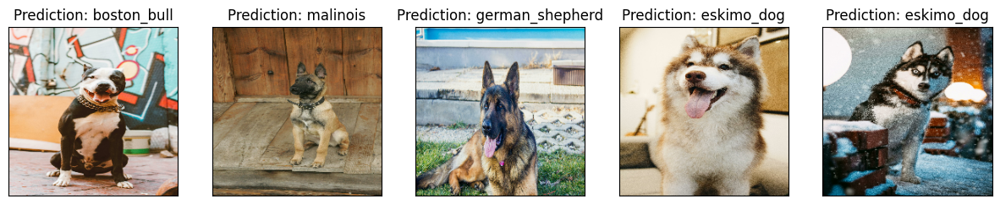

In [ ]:
# Check  custom image predictions
plt.figure(figsize=(10,10))
plt.figure(figsize=(5 * 3, 1 * 3))
for i,image in enumerate(custom_images):
  plt.subplot(1,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(f"Prediction: {custom_pred_labels[i]}")
  plt.imshow(image)